In [31]:
import matplotlib.pyplot as plt 
import numpy as np
import astropy.units as u
from astropy.io import fits
from astropy.wcs import WCS
from reproject import reproject_interp
from astropy.visualization import simple_norm

import glob
from PIL import Image
import os
from IPython import display

%matplotlib inline

In [2]:
# load fits data 
# original cube 

data_cube = fits.getdata("/home/angeldavid/Desktop/Fedora/RESEARCH-INTERSHIPS/data_cubes/NGC7753/S2349+2904_HIcube2_clean_smooth_image_5_cube_kms.fits")
data_header =fits.getheader("/home/angeldavid/Desktop/Fedora/RESEARCH-INTERSHIPS/data_cubes/NGC7753/S2349+2904_HIcube2_clean_smooth_image_5_cube_kms.fits")
# mask 
data_mask= fits.getdata("/home/angeldavid/Desktop/Fedora/RESEARCH-INTERSHIPS/data_cubes/NGC7753/S2349+2904_HIcube2_clean_smooth_image_5_mask_kms.fits")
# residual cube
data_residual  = fits.getdata("/home/angeldavid/Desktop/Fedora/RESEARCH-INTERSHIPS/data_cubes/USNOA2-1125-19940303/residual_gas_cube.fits")
data_residual_header = fits.getheader("/home/angeldavid/Desktop/Fedora/RESEARCH-INTERSHIPS/data_cubes/USNOA2-1125-19940303/residual_gas_cube.fits")

# data of the model NGC7753
directory_7753 = "/home/angeldavid/Desktop/Fedora/RESEARCH-INTERSHIPS/data_cubes/NGC7753/"
data_model_ngc7753 = fits.getdata(directory_7753 + "output3/SoFiA_J234703.61+292835.6/SoFiA_J234703.61+292835.6mod_azim.fits")

# data for the model ngc7752
directory_7752 = "/home/angeldavid/Desktop/Fedora/RESEARCH-INTERSHIPS/data_cubes/NGC7752/"
data_model_ngc7752 = fits.getdata(directory_7752 + "output5/SoFiA_J234703.61+292835.6/SoFiA_J234703.61+292835.6mod_azim.fits")
data_ngc7752 = fits.getdata(directory_7752 + "ngc7752_cube.fits")


# data for the model of the companion galaxy 2MASXJ23470758+2926531
directory_companion = "/home/angeldavid/Desktop/Fedora/RESEARCH-INTERSHIPS/data_cubes/USNOA2-1125-19940303/"
data_model_companion = fits.getdata(directory_companion+"output11/SoFiA_J234703.61+292835.6/SoFiA_J234703.61+292835.6mod_azim.fits")
data_arp3 = fits.getdata(directory_companion + "arp86-3_cube.fits")


In [3]:
# compute rms for threshold
rms1 = np.nanstd(data_cube)
rms2 = np.nanstd(data_residual)

In [4]:
#data_cube_masked = np.where(data_cube > 1*rms1, data_cube, np.nan)
data_cube_masked = np.where(data_mask,data_cube,0)
data_residual_masked = np.where(data_residual > 1*rms2, data_residual, np.nan)

In [5]:
[np.percentile(data_cube[3,:,:],99.8)]


[np.float32(0.003088784)]

In [6]:

for i in range(data_cube.shape[0]):
#for i in range(0,3):
    fig = plt.figure(figsize=(11,10))
    ax = fig.add_subplot()
    plt.imshow(data_cube[i,:,:])
    plt.contour(data_cube[i,:,:], levels=[np.percentile(data_cube[i,:,:],98.8)], colors='w')
    plt.contour(data_model_ngc7753[i,:,:], levels=[np.percentile(data_model_ngc7753[i,:,:],98.8)], colors='r')
    plt.contour(data_model_ngc7752[i,:,:], levels=[np.percentile(data_model_ngc7752[i,:,:],98.8)], colors='b')
    plt.contour(data_model_companion[i,:,:], levels=[np.percentile(data_model_companion[i,:,:],98.8)], colors='green')
    #plt.contour(data_model_ngc7753[i,:,:], levels=5, colors='r')
    #plt.contour(data_model_ngc7752[i,:,:], levels=5, colors='b')
    #plt.contour(data_model_companion[i,:,:], levels=5, colors='green')
    plt.contour(data_residual[i,:,:], levels=[np.percentile(data_residual[i,:,:],99.8)], colors='yellow',linewidth=2)


    ax.set_xlabel('RA', size=18,family='serif')
    ax.set_ylabel('Dec', size=18,family='serif')
    #plt.xlim([0,9])
    #plt.ylim([0,9])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    plt.savefig('plots/{}_{:02d}.png'.format("gas_system", i)) # saving the figure using all 2 digit numbers
    plt.close()

/tmp/ipykernel_6310/1898765600.py:13: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(data_residual[i,:,:], levels=[np.percentile(data_residual[i,:,:],99.8)], colors='yellow',linewidth=2)


In [7]:
# input images
images_input = 'plots/{}_***.png'.format("gas_system")
# output gif
imgif_output = 'plots/{}_animation.gif'.format("gas_system")

# Collect the images
imgs = (Image.open(f) for f in sorted(glob.glob(images_input)))

img = next(imgs)

# save the gif file
img.save(fp = imgif_output, format = "GIF", append_images = imgs, save_all = True, duration = 300, loop = 0)

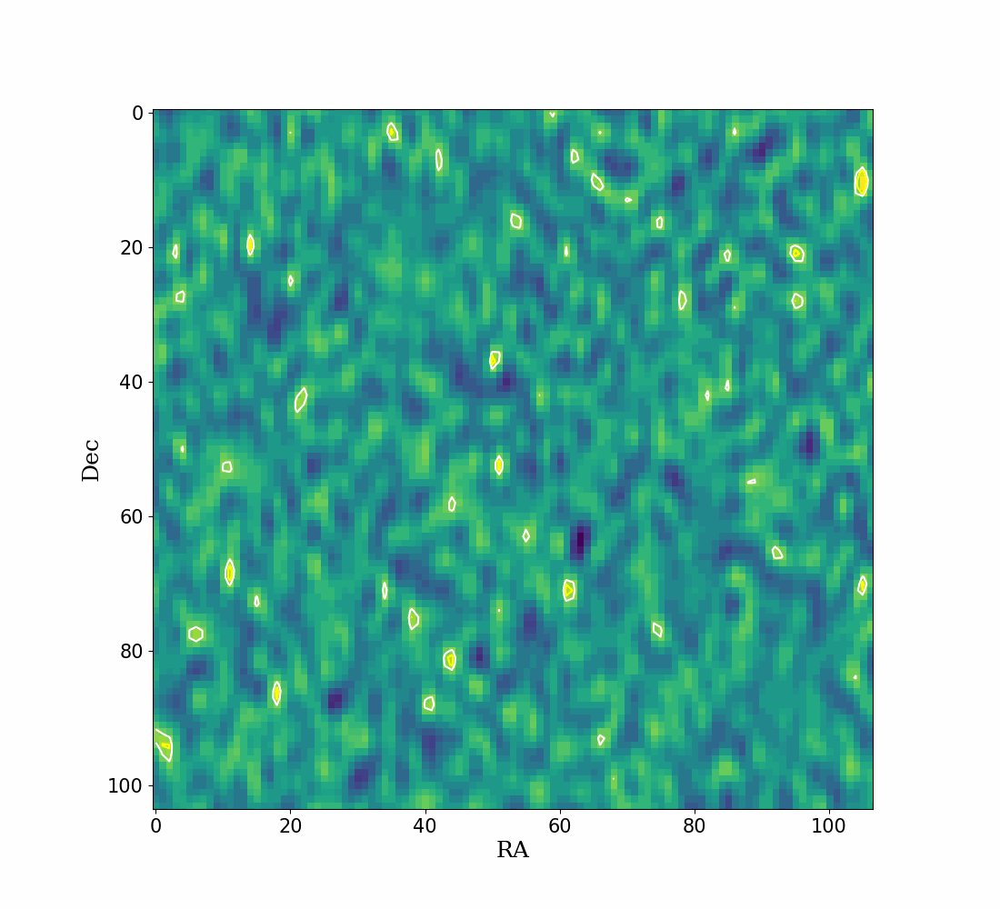

In [8]:
# Show the animation
display.Image('plots/{}_animation.gif'.format("gas_system"))

In [11]:

for i in range(data_residual.shape[0]):
#for i in range(0,3):
    fig = plt.figure(figsize=(11,10))
    ax = fig.add_subplot()
    plt.imshow(data_residual[i,:,:])
    plt.contour(data_residual[i,:,:], levels=[np.percentile(data_residual[i,:,:],99.8)], colors='w')
    ax.set_xlabel('RA', size=18,family='serif')
    ax.set_ylabel('Dec', size=18,family='serif')
    #plt.xlim([0,9])
    #plt.ylim([0,9])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    plt.savefig('plots/{}_{:02d}.png'.format("gas_residual", i)) # saving the figure using all 2 digit numbers
    plt.close()

In [12]:
# input images
images_input = 'plots/{}_***.png'.format("gas_residual")
# output gif
imgif_output = 'plots/{}_animation.gif'.format("gas_residual")

# Collect the images
imgs = (Image.open(f) for f in sorted(glob.glob(images_input)))

img = next(imgs)

# save the gif file
img.save(fp = imgif_output, format = "GIF", append_images = imgs, save_all = True, duration = 300, loop = 0)

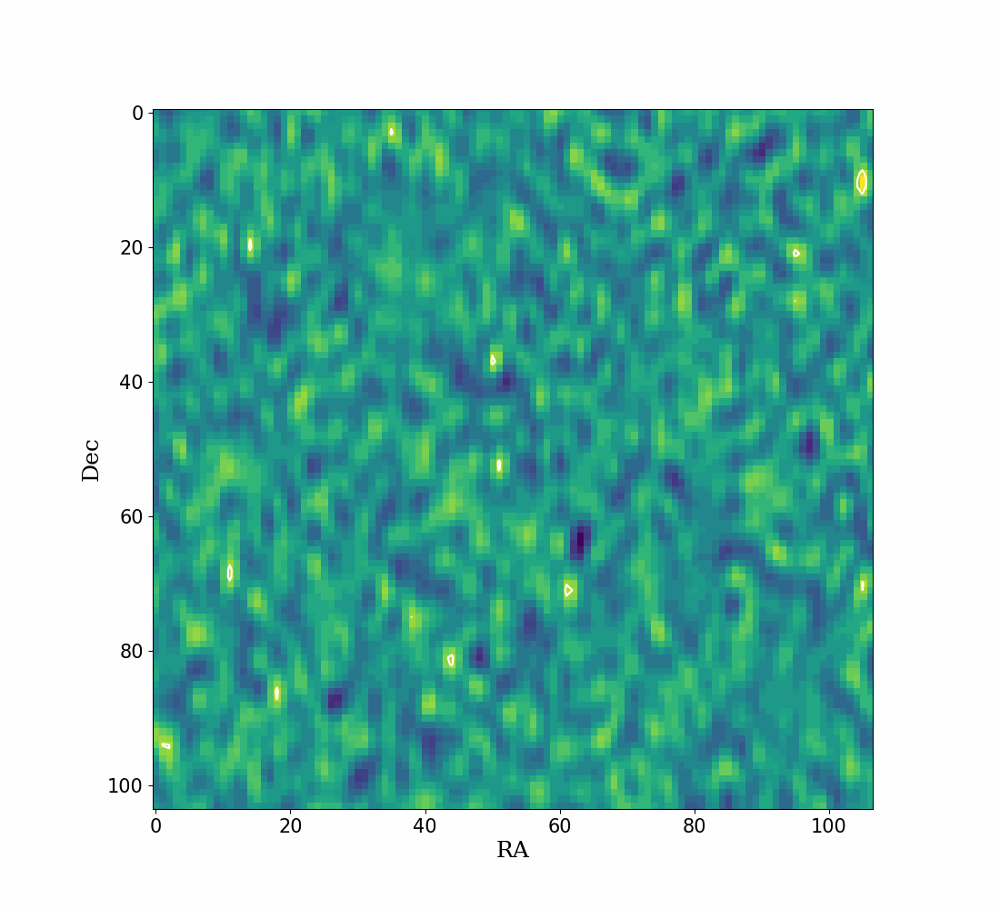

In [13]:
display.Image('plots/{}_animation.gif'.format("gas_residual"))

In [14]:
from IPython.display import display, HTML
import time

timestamp = int(time.time())
display(HTML(f"""
<table>
<tr>
<td><img src='plots/gas_system_animation.gif?{timestamp}' width='400'></td>
<td><img src='plots/gas_residual_animation.gif?{timestamp}' width='400'></td>
</tr>
</table>
"""))

,


## NGC7752

In [17]:

for i in range(60,data_model_ngc7752.shape[0]):
#for i in range(0,3):
    fig = plt.figure(figsize=(11,10))
    ax = fig.add_subplot()
    plt.imshow(data_model_ngc7752[i,:,:])
    plt.contour(data_model_ngc7752[i,:,:], levels=[np.percentile(data_model_ngc7752[i,:,:],99.8)], colors='w')
    
    ax.set_xlabel('RA', size=18,family='serif')
    ax.set_ylabel('Dec', size=18,family='serif')
    #plt.xlim([0,9])
    #plt.ylim([0,9])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    plt.savefig('plots/{}_{:02d}.png'.format("gas_ngc7752", i)) # saving the figure using all 2 digit numbers
    plt.close()

In [20]:
# input images
images_input = 'plots/{}_***.png'.format("gas_ngc7752")
# output gif
imgif_output = 'plots/{}_animation.gif'.format("gas_ngc7752")

# Collect the images
imgs = (Image.open(f) for f in sorted(glob.glob(images_input)))

img = next(imgs)

# save the gif file
img.save(fp = imgif_output, format = "GIF", append_images = imgs, save_all = True, duration = 150, loop = 0)

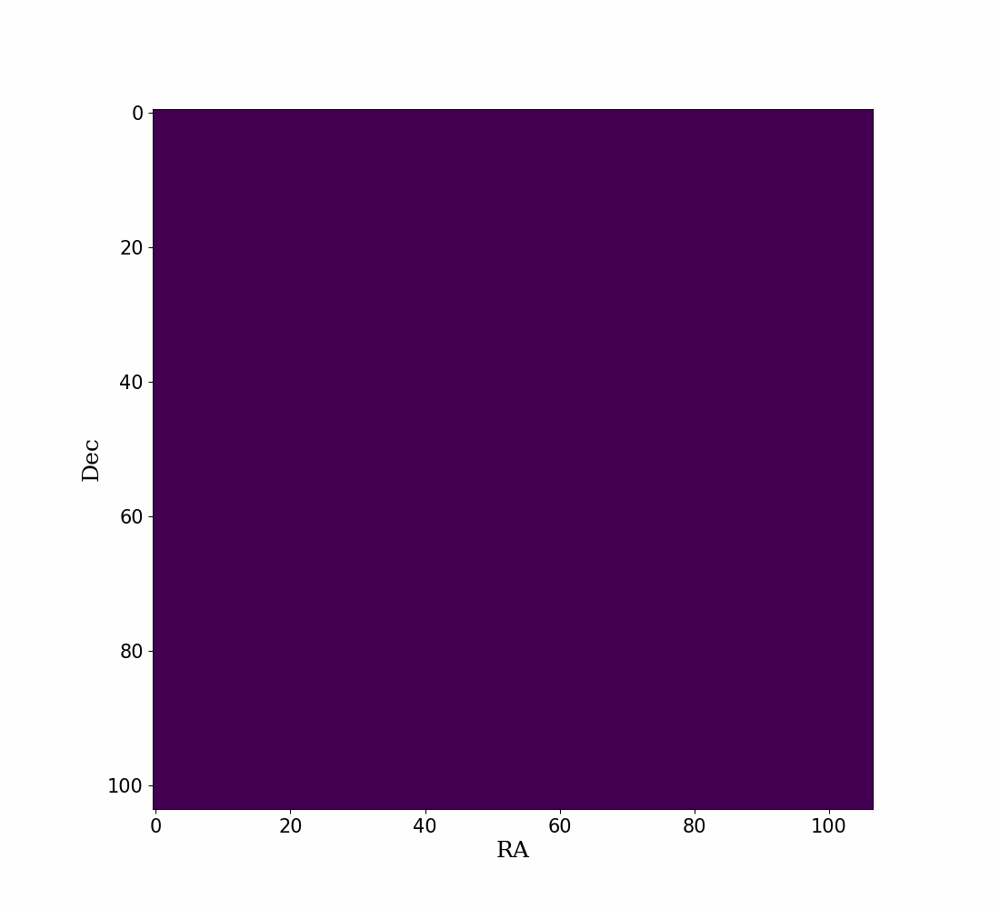

In [21]:
# Show the animation
display.Image('plots/{}_animation.gif'.format("gas_ngc7752"))

## Overlay of the model in the optical image

In [11]:
header_optical = fits.getheader("/home/angeldavid/Desktop/Fedora/RESEARCH-INTERSHIPS/data_cubes/NGC7753/ngc7753-optical.fits")
data_optical = fits.getdata("/home/angeldavid/Desktop/Fedora/RESEARCH-INTERSHIPS/data_cubes/NGC7753/ngc7753-optical.fits")

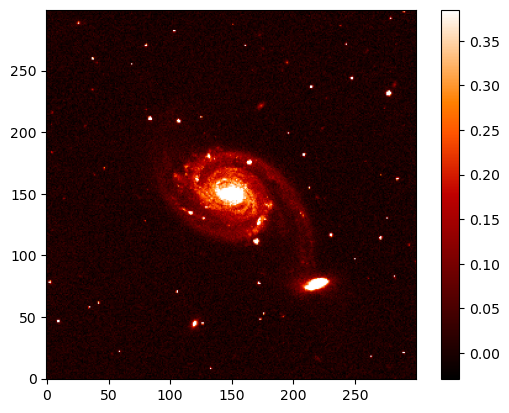

In [13]:
vmin, vmax = np.percentile(data_optical, [1, 99.5])
plt.imshow(data_optical, cmap='gist_heat', vmin=vmin, vmax=vmax, origin='lower')
plt.colorbar()
plt.show()

In [14]:
mom0_ngc7753 = fits.getdata(directory_7753+"output3/SoFiA_J234703.61+292835.6/maps/SoFiA_J234703.61+292835.6mod_0mom_azim.fits")
#
mom0_ngc7752 = fits.getdata(directory_7752+"output5/SoFiA_J234703.61+292835.6/maps/SoFiA_J234703.61+292835.6mod_0mom_azim.fits")
#
mom0_arp3 = fits.getdata(directory_companion+"output11/SoFiA_J234703.61+292835.6/maps/SoFiA_J234703.61+292835.6mod_0mom_azim.fits")

In [25]:
hdul_mom0_7753 = fits.open(directory_7753+"output3/SoFiA_J234703.61+292835.6/maps/SoFiA_J234703.61+292835.6mod_0mom_azim.fits")
hi_reprojected_0_7753,footprint_7753 = reproject_interp(hdul_mom0_7753,header_optical)
rms_mom0_7753 = np.sqrt(np.nanmean(hi_reprojected_0_7753**2))
# 
hdul_mom0_7752 = fits.open(directory_7752+"output5/SoFiA_J234703.61+292835.6/maps/SoFiA_J234703.61+292835.6mod_0mom_azim.fits")
hi_reprojected_0_7752,footprint_7752 = reproject_interp(hdul_mom0_7752,header_optical)
rms_mom0_7752 = np.sqrt(np.nanmean(hi_reprojected_0_7752**2))
#
hdul_mom0_arp3 = fits.open(directory_companion+"output11/SoFiA_J234703.61+292835.6/maps/SoFiA_J234703.61+292835.6mod_0mom_azim.fits")
hi_reprojected_0_arp3,footprint_arp3 = reproject_interp(hdul_mom0_arp3,header_optical)
rms_mom0_arp3 = np.sqrt(np.nanmean(hi_reprojected_0_arp3**2))

In [26]:

print(rms_mom0_7753)
print(np.nanmax(hi_reprojected_0_7753)) 
print(rms_mom0_7752)
print(np.nanmax(hi_reprojected_0_7752))
print(rms_mom0_arp3)
print(np.nanmax(hi_reprojected_0_arp3))

0.4958519697019856
1.2367372512817383
0.1883701351778211
0.7813631296157837
0.09872962016995578
0.4089292287826538


### Moment 0

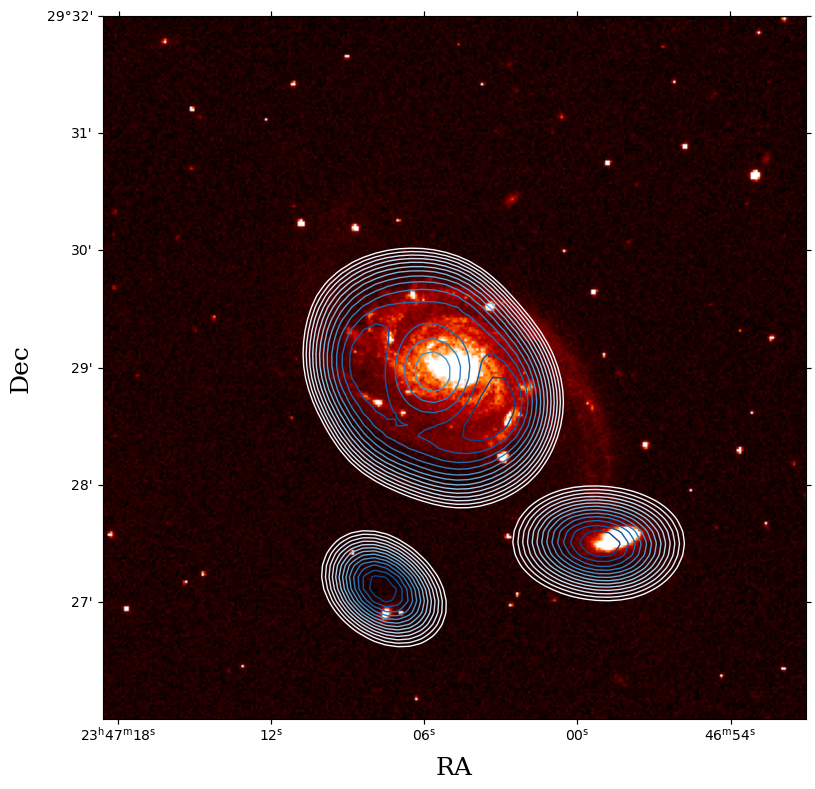

In [27]:
fig = plt.figure(figsize=(9, 8))
ax = fig.add_subplot(1, 1, 1, projection=WCS(header_optical))

# Background: Optical image
cb = ax.imshow(
    data_optical,
    cmap='gist_heat',  
    origin='lower',
    vmin=vmin, vmax=vmax,
)


levels1 = np.linspace(1.5 * rms_mom0_7753, np.nanmax(hi_reprojected_0_7753), 14)
ax.contour(
    hi_reprojected_0_7753,
    levels=levels1,
    cmap='Blues', 
    linewidths=1,
)

levels2 = np.linspace(1.5 * rms_mom0_7752, np.nanmax(hi_reprojected_0_7752), 14)
ax.contour(
    hi_reprojected_0_7752,
    levels=levels2,
    cmap='Blues', 
    linewidths=1,
)

levels3 = np.linspace(1.5 * rms_mom0_arp3, np.nanmax(hi_reprojected_0_arp3), 14)
ax.contour(
    hi_reprojected_0_arp3,
    levels=levels3,
    cmap='Blues', 
    linewidths=1,
)


ax.set_xlabel('RA', size=18, family='serif')
ax.set_ylabel('Dec', size=18, family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)


plt.tight_layout()
plt.show()

### Moment 1

In [28]:
hdul_mom1_7753 = fits.open(directory_7753+"output3/SoFiA_J234703.61+292835.6/maps/SoFiA_J234703.61+292835.6mod_1mom_azim.fits")
hi_reprojected_1_7753,footprint_7753 = reproject_interp(hdul_mom1_7753,header_optical)
rms_mom1_7753 = np.sqrt(np.nanmean(hi_reprojected_1_7753**2))
# 
hdul_mom1_7752 = fits.open(directory_7752+"output5/SoFiA_J234703.61+292835.6/maps/SoFiA_J234703.61+292835.6mod_1mom_azim.fits")
hi_reprojected_1_7752,footprint_7752 = reproject_interp(hdul_mom1_7752,header_optical)
rms_mom1_7752 = np.sqrt(np.nanmean(hi_reprojected_1_7752**2))
#
hdul_mom1_arp3 = fits.open(directory_companion+"output11/SoFiA_J234703.61+292835.6/maps/SoFiA_J234703.61+292835.6mod_1mom_azim.fits")
hi_reprojected_1_arp3,footprint_arp3 = reproject_interp(hdul_mom1_arp3,header_optical)
rms_mom1_arp3 = np.sqrt(np.nanmean(hi_reprojected_1_arp3**2))

In [29]:

print(rms_mom1_7753)
print(np.nanmax(hi_reprojected_1_7753)) 
print(rms_mom1_7752)
print(np.nanmax(hi_reprojected_1_7752))
print(rms_mom1_arp3)
print(np.nanmax(hi_reprojected_1_arp3))

5089.955195767033
5228.9013671875
4930.426490331839
4983.16650390625
4955.001469222061
4979.77294921875


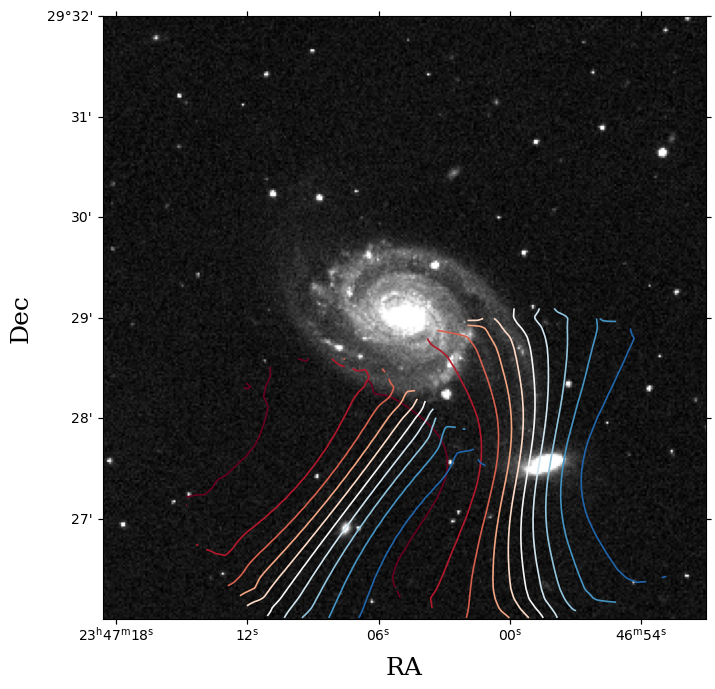

In [40]:
fig = plt.figure(figsize=(8, 7))
ax = fig.add_subplot(1, 1, 1, projection=WCS(header_optical))

# Use log stretch for better contrast in faint structures
norm = simple_norm(data_optical, 'log', percent=99.5)
ax.imshow(data_optical, cmap='gist_gray', vmin=vmin,vmax=vmax, origin='lower')

# Velocity field (moment 1) contours: reversed RdBu, centered around systemic velocity
# Adjust levels if needed based on your specific velocity range
vel_min1, vel_max1 = np.nanmin(hi_reprojected_1_7753), np.nanmax(hi_reprojected_1_7753)  # You can automate this with np.nanmin/max if desired
levelsm1 = np.arange(vel_min1, vel_max1, 20)
#cont = ax.contour(hi_reprojected_1_7753, levels=levelsm1, cmap='RdBu_r', linewidths=1.2)

vel_min2, vel_max2 = np.nanmin(hi_reprojected_1_7752), np.nanmax(hi_reprojected_1_7752)  # You can automate this with np.nanmin/max if desired
levelsm2 = np.arange(vel_min2, vel_max2, 10)
cont = ax.contour(hi_reprojected_1_7752, levels=levelsm2, cmap='RdBu_r', linewidths=1.2)

vel_min3, vel_max3 = np.nanmin(hi_reprojected_1_arp3), np.nanmax(hi_reprojected_1_arp3)  # You can automate this with np.nanmin/max if desired
levelsm3 = np.arange(vel_min3, vel_max3, 5)
cont = ax.contour(hi_reprojected_1_arp3, levels=levelsm3, cmap='RdBu_r', linewidths=1.2)



ax.set_xlabel('RA', size=18, family='serif')
ax.set_ylabel('Dec', size=18, family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

# save figure 
# plt.savefig('velocity_overlay.svg', dpi=300)

plt.tight_layout()
plt.show()